<a href="https://colab.research.google.com/github/SihaoCheng/scattering_transform/blob/master/scattering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# mount google drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# import packages
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import torch

# import scattering package
import sys
colab_dir = '/content/drive/MyDrive/Colab Notebooks/'
sys.path.append(colab_dir)
import scattering

Mounted at /content/drive
use torch backend


In [9]:
import scattering
import importlib
importlib.reload(scattering)

<module 'scattering' from '/content/drive/MyDrive/Colab Notebooks/scattering/__init__.py'>

# 1. Analysis Examples

## 1.1 one field

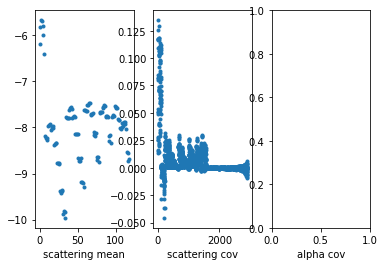

In [7]:
# define calculators
M = N = 256
J = 7
L = 4
ac_calc = scattering.PhaseHarmonics2d(M, N, J, L, device='gpu')
st_calc = scattering.Scattering2d(M, N, J, L, device='gpu', wavelets='morlet')

k_range = np.logspace(0,np.log10(M/2*1.4), J-1)
bi_calc = scattering.Bispectrum_Calculator(k_range, M, N, device='gpu')

# load image
image_input = np.load(colab_dir + 'H51_9.npy')[None,:M,:N]

# calculate estimators
s_mean = st_calc.scattering_coef(image_input, flatten=True)['for_synthesis_iso']
s_cov  = st_calc.scattering_cov (image_input, flatten=True)['for_synthesis_iso']
alpha_cov = ac_calc.forward(image_input)
bi = bi_calc.forward(image_input)

# plot
# print(s_mean.shape, s_cov.shape, alpha_cov.shape)
plt.subplot(131)
plt.plot(s_mean[0].cpu(),'.')
plt.xlabel('scattering mean')
plt.subplot(132)
plt.plot(s_cov[0,20:].cpu(),'.')
plt.xlabel('scattering cov')
plt.subplot(133)
# plt.plot(alpha_cov[0].cpu(),'.')
plt.xlabel('alpha cov')
plt.show()

## 1.2 two fields

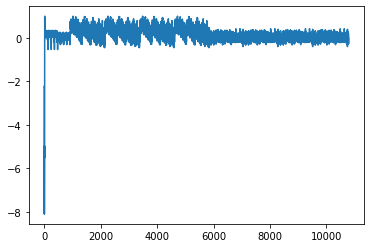

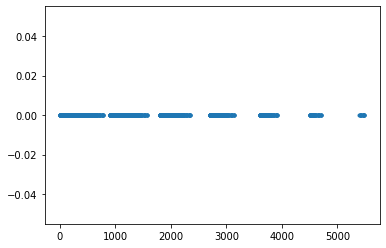

In [2]:
# define calculator
M = N = 256
J = 7
L = 4
st_calc = scattering.Scattering2d(M, N, J, L, device='gpu')

# load image (image1,2 should have a shape of [N_image, N_xpix, N_ypix])
image1 = np.load(colab_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:M,:N,1,0]
image2 = np.load(colab_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:M,:N,1,0]

# calculate scattering correlations, including auto and cross terms for the 2 fields
s_cov_2fields = st_calc.scattering_cov_2fields(image1, image2, normalization='P11', flatten=True)
plt.plot(s_cov_2fields['for_synthesis_iso'][0].cpu())
plt.show()

# comparison between auto and cross terms. Because the field1 and field2 are identical in my case, I expect
# that the cross terms are also identical to the auto terms.
s_cov_2fields = st_calc.scattering_cov_2fields(image1, image2, flatten=False)
plt.plot(
    (s_cov_2fields['Corr11_iso'][0,3] - s_cov_2fields['Corr11_iso'][0,3]*1).cpu().real.flatten(), '.-'
)
plt.show()

# 2. Synthesis Examples

## 2.1 one field, target is the texture of an image(s)

In [4]:
# load images
# image_target = np.load(colab_dir + 'turing_pattern_array.npy').astype(np.float32)[:10]
# image_target = np.log(np.load(colab_dir + 'H81_0_Quijote.npy')[None,:256,:256]+1)
# image_target = np.load(colab_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:,:,1,2]

# image show
def show(image_target, image_syn, v_range=(-3, 3)):
    vmin, vmax = v_range
    for i in range(len(image_syn)):
        plt.figure(figsize=(9,3),dpi=100)
        plt.subplot(131); plt.imshow(image_target[i], vmin=vmin, vmax=vmax )
        plt.subplot(132); plt.imshow(image_syn[i], vmin=vmin, vmax=vmax )
        plt.subplot(133)
        plt.hist(image_target[i].flatten(),20,(vmin,vmax),histtype='step',label='target')
        plt.hist(image_syn[i].flatten(),20,(vmin,vmax),histtype='step',label='synthesized')
        plt.legend(); plt.yscale('log'); plt.show()

input_size:  (1, 256, 256)


/content/drive/MyDrive/Colab Notebooks/scattering/__init__.py:43: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if image_init=='random phase':


# of estimators:  2927
max residual:  6.3487434 , mean residual:  0.018660009
max residual:  0.0040675625 , mean residual:  0.00014714364
time used:  39.94520568847656 s


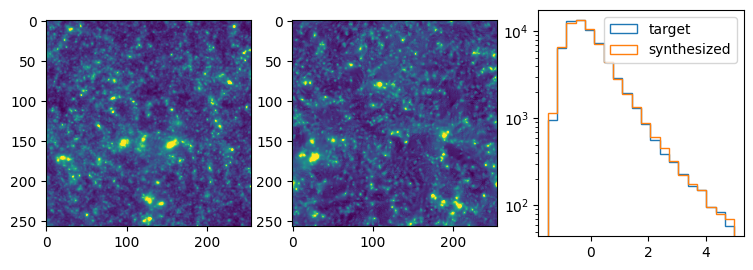

In [5]:
# load image
image_target = scattering.whiten(np.load(colab_dir + 'H_51.npy')[:1,:256,:256])
# synthesize
image_syn = scattering.synthesis('s_cov_iso', image_target, seed=0)
# show
show(image_target, image_syn, (-1.5, 5))

### draft for thresholding

input_size:  (1, 256, 256)


/content/drive/MyDrive/Colab Notebooks/scattering/__init__.py:43: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if image_init=='random phase':


# of estimators:  4383
max residual:  6.3487434 , mean residual:  0.0143364305
max residual:  0.014633568 , mean residual:  0.00021443637
time used:  34.81943488121033 s


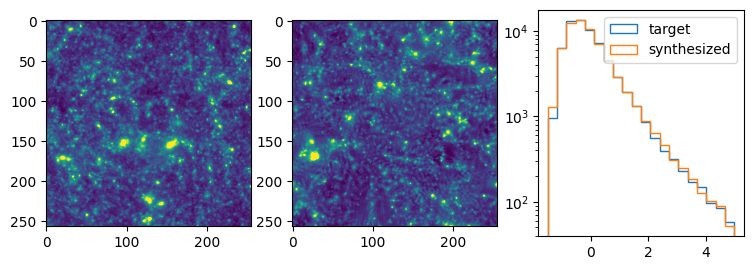

In [11]:
# example 2: customized loss
import torch.fft
def s_cov_iso_cut(s_cov, target):
    L = 4
    coef = s_cov['for_synthesis_iso']
    index_type, j1, l1, j2, l2, j3, l3 = s_cov['index_for_synthesis_iso']
    
    C01re_f = torch.fft.rfft(coef[:,index_type==3].reshape(-1,L))
    select1 = C01re_f.abs() > 1e-5
    C01im_f = torch.fft.rfft(coef[:,index_type==4].reshape(-1,L))
    select2 = C01im_f.abs() > 1e-5
    C11re_f = torch.fft.rfft2(coef[:,index_type==5].reshape(-1,L,L))
    select3 = C11re_f.abs() > 1e-5
    C11im_f = torch.fft.rfft2(coef[:,index_type==6].reshape(-1,L,L))
    select4 = C11im_f.abs() > 1e-5
    
    return torch.cat((
        (coef[:,index_type<3]),
        (C01re_f.select1.real,
        (C01re_f.reshape(len(coef),-1)).imag,
        (C01im_f.reshape(len(coef),-1)).real,
        (C01im_f.reshape(len(coef),-1)).imag,
        (C11re_f.reshape(len(coef),-1)).real,
        (C11re_f.reshape(len(coef),-1)).imag,
        (C11im_f.reshape(len(coef),-1)).real,
        (C11im_f.reshape(len(coef),-1)).imag,
    ), dim=-1)
    
# load image
image_target = scattering.whiten(np.load(colab_dir + 'H_51.npy')[:1,:256,:256])
# synthesize
image_syn = scattering.synthesis('s_cov_func', image_target, seed=0, s_cov_func=s_cov_iso_cut)
# show
show(image_target, image_syn, (-1.5, 5))

### synthesis results with different estimators

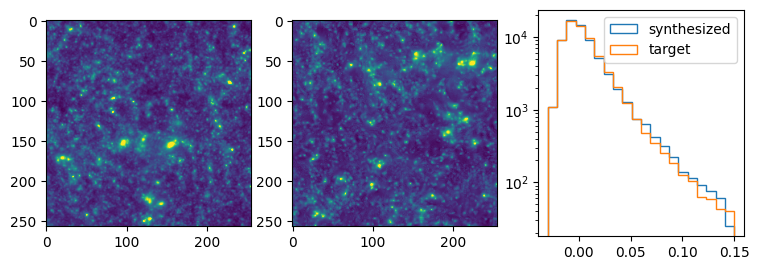

In [ ]:
# s_cov P00 all

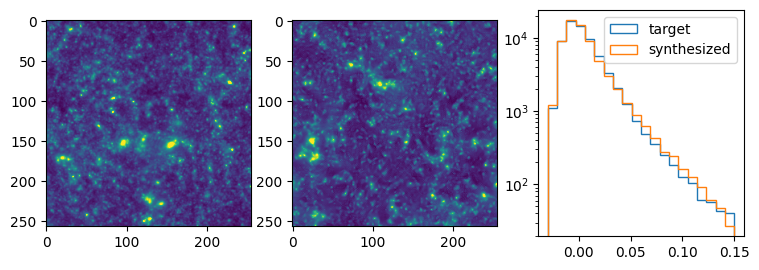

In [18]:
# s_cov_iso_para_perp P00 all

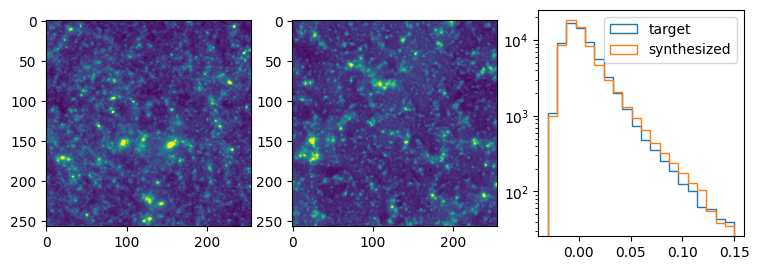

In [10]:
# s_cov_iso_iso P00 all

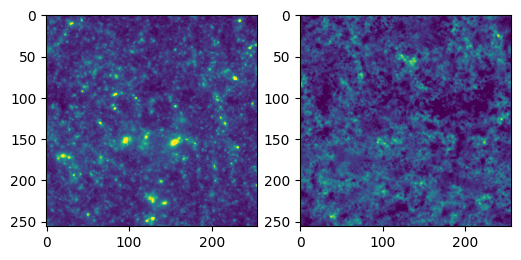

In [ ]:
# s_cov_iso shannon wavelet, J6 29s

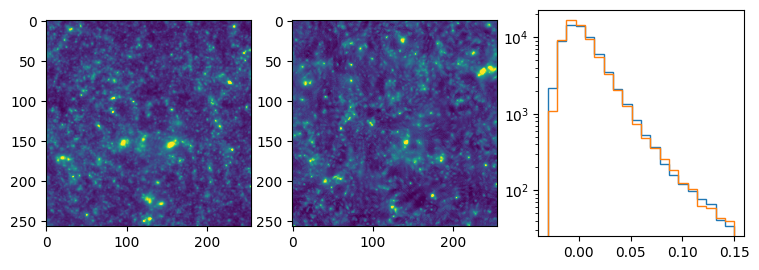

In [ ]:
# s_cov_iso P11 all

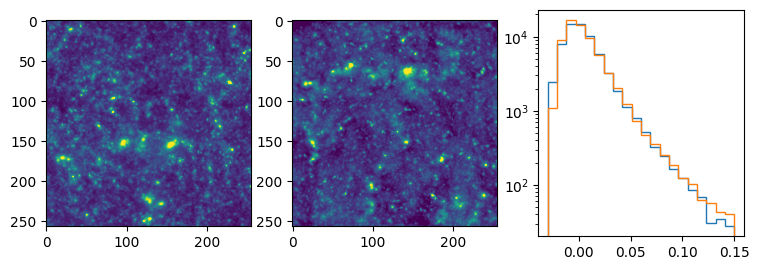

In [ ]:
# alpha_cov

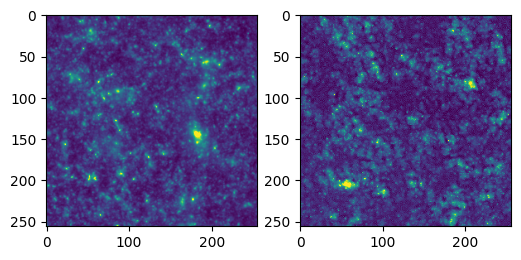

In [ ]:
# bi_linear

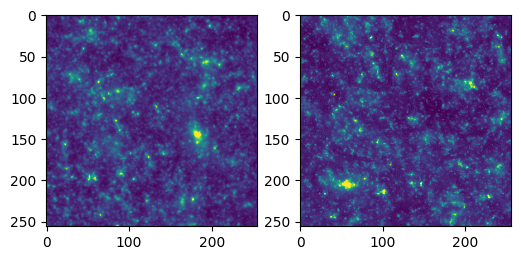

In [ ]:
# bi_log

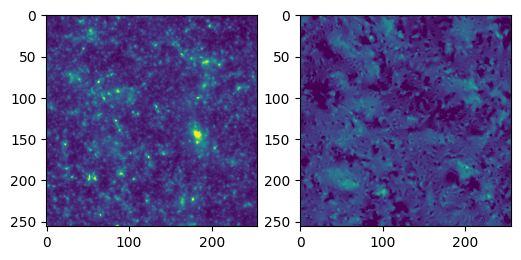

In [ ]:
# s_mean

### turbulence synthesis

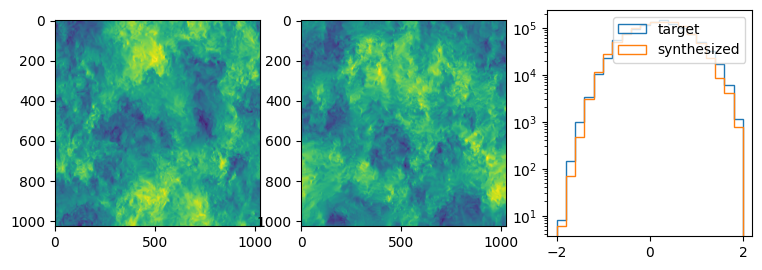

In [177]:
# s_cov_iso P00 all

### quijote filament synthesis

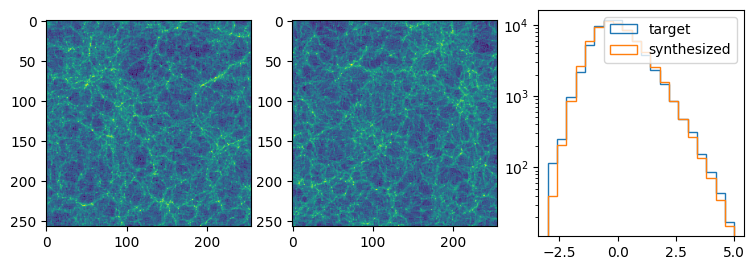

In [157]:
# s_cov P00 all

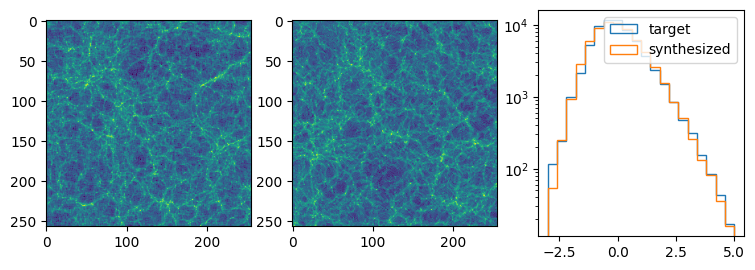

In [164]:
# s_cov_iso P00 all

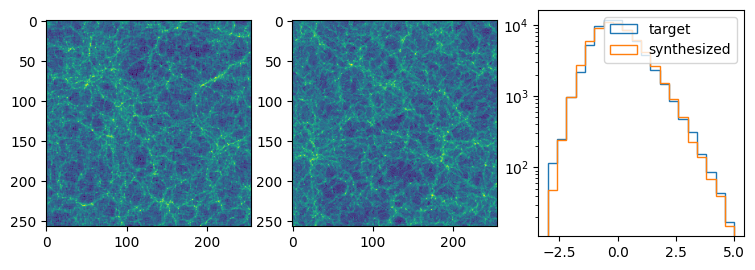

In [162]:
# s_cov_iso_para_perp P00 all

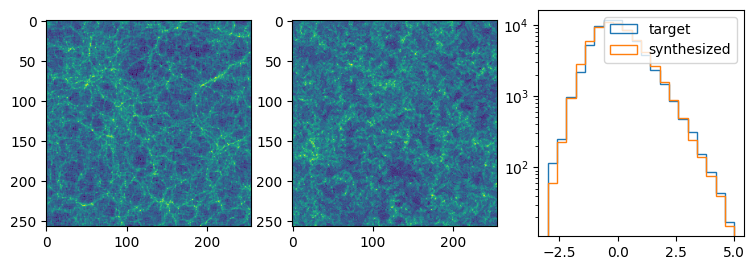

In [159]:
# s_cov_iso_iso P00 all

## 2.2 one field, target is the value of coefs

### example 1: interpolation of two images

In [83]:
normalization = 'P00'

# load two images
M = N = 256
image_target1 = scattering.whiten(np.log(np.load(colab_dir + 'H81_0_Quijote.npy')[None,:M,:N]+1))
image_target2 = scattering.whiten(np.load(colab_dir + 'H_51.npy').astype(np.float32)[:1,:M,:N])

# calculate scattering correlations for them
J = 7; L = 4
st_calc = scattering.Scattering2d(M, N, J, L, device='gpu')
s_cov1 = st_calc.scattering_cov(image_target1, flatten=True, 
                                normalization=normalization)['for_synthesis_iso']
s_cov2 = st_calc.scattering_cov(image_target2, flatten=True, 
                                normalization=normalization)['for_synthesis_iso']

In [84]:
# linearly interpolate the coefficients between image1 and image2
coef_target_list = []
param_list = [0.75, 0.5, 0.25, 0.]
for factor in param_list:
    coef_target_list.append(factor * s_cov1 + (1-factor) * s_cov2)

coef_target = torch.cat(coef_target_list, dim=0)
image_init = image_target1 * np.ones((len(param_list),1,1))

# synthesize based on values of coefficients
# 's_mean', 's_mean_iso', 's_cov', 's_cov_iso', 'alpha_cov', 'bispectrum'
image_syn = scattering.synthesis(
    's_cov_iso', coef_target, mode='estimator',
    M=M, N=N, J=J, L=L, image_init=image_init,
    steps=200, seed=0, normalization=normalization,
    # print_each_step=True
)

/content/drive/MyDrive/Colab Notebooks/scattering/__init__.py:40: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if image_init=='random phase':


# of estimators:  2927
max residual:  1.2190745 , mean residual:  0.004900724
max residual:  0.008730665 , mean residual:  0.00015624551
time used:  23.688994884490967 s


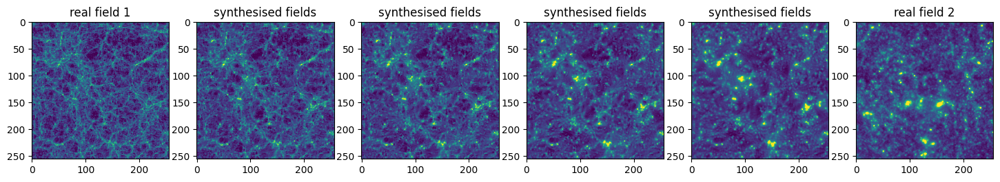

In [85]:
# plot result
plt.figure(figsize=((2+len(image_syn))*3,3),dpi=100)
plt.subplot(1,2+len(image_syn),1)
plt.imshow(image_target1[0], vmin=-1.5, vmax=5.15)#vmin=0, vmax=6
plt.title('real field 1')

for i in range(len(image_syn)):
    plt.subplot(1,2+len(image_syn),i+2)
    plt.imshow(image_syn[i], vmin=-1.5, vmax=5.15)#vmin=0, vmax=6
    plt.title('synthesised fields')

plt.subplot(1,2+len(image_syn),2+len(image_syn))
plt.imshow(image_target2[0], vmin=-1.5, vmax=5.15)#vmin=0, vmax=6
plt.title('real field 2')
plt.show()

### interpolation synthesis with alpha scattering (not successful)

In [ ]:
ac_calc = scattering.PhaseHarmonics2d(M, N, J, L, device='gpu')
alpha_cov1 = ac_calc(image_target1)
alpha_cov2 = ac_calc(image_target2)

# alpha
# synthesize
# 's_mean', 's_mean_iso', 's_cov', 's_cov_iso', 'alpha_cov', 'bispectrum'

r1 = 0.75
coef_target = r1 * alpha_cov1 + (1-r1) * alpha_cov2
image_init = image_target1 + 0.0
for r1 in [0.5, 0.25, 0.]:
    coef_target = torch.cat(
        (coef_target, r1 * alpha_cov1 + (1-r1) * alpha_cov2), dim=0,
    )
    image_init = np.concatenate(
        (image_init, image_target1), axis=0
    )

image_syn = scattering.synthesis(
    'alpha_cov', coef_target, M=M, N=N, J=J, L=L, 
    mode='estimator', steps=600, learning_rate=0.5, device='gpu', seed=0,
    image_init=image_init)

number of moments (without low-pass and harr):  56640
this chunk 0  size is  960  among  960
# of estimators:  12534
max residual:  527.0197 , mean residual:  5.097191
max residual:  527.0197 , mean residual:  4.768888
time used:  42.67179751396179 s


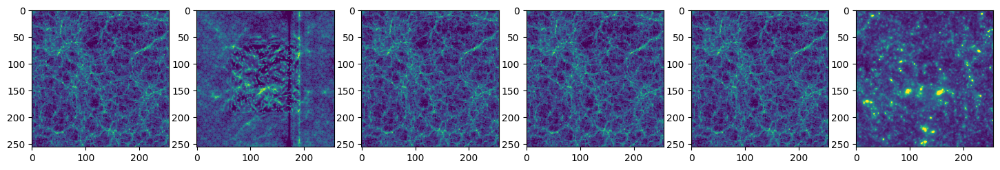

In [ ]:
# alpha
plt.figure(figsize=((2+len(image_syn))*3,3),dpi=100)
plt.subplot(1,2+len(image_syn),1)
plt.imshow((image_target1[0] - image_target1[0].mean())/ image_target1[0].std(), vmin=-1.5, vmax=5.15)#vmin=0, vmax=6
for i in range(len(image_syn)):
    plt.subplot(1,2+len(image_syn),i+2)
    plt.imshow((image_syn[i] - image_syn[i].mean()) / image_syn[i].std(), vmin=-1.5, vmax=5.15)#vmin=0, vmax=6
plt.subplot(1,2+len(image_syn),2+len(image_syn))
plt.imshow((image_target2[0] - image_target2[0].mean())/ image_target2[0].std(), vmin=-1.5, vmax=5.15)#vmin=0, vmax=6
plt.show()

### example 2: changing the overall amplitude of one type of coef.

In [147]:
# define calculators
M = N = 256; J = 7; L = 4
st_calc = scattering.Scattering2d(M, N, J, L, device='gpu', wavelets='morlet')

# load image
image_input = scattering.whiten(np.log(np.load(colab_dir + 'H81_0_Quijote.npy')[None,:M,:N]+1))
# image_input = scattering.whiten(np.load(colab_dir + 'H51_9.npy')[None,:M,:N])

# calculate estimators
s_cov_set = st_calc.scattering_cov(image_input, flatten=True)
index_type, j1, l1, j2, l2, j3, l3 = s_cov_set['index_for_synthesis_iso']

In [148]:
# change the overall amplitude of C01 coefficients
s_cov_list = []
param_list1 = [-1.5, -1, -0.5, 0, 0.5, 1, 1.5]
for factor in param_list1:
    s_cov = s_cov_set['for_synthesis_iso'].cpu()*1.
    s_cov[:,index_type==3] *= factor # C01_real is scaled by a factor
    s_cov[:,index_type==4] *= factor # C01_imag is scaled by a factor
    s_cov_list.append(s_cov)

# change the overal amplitude of C11 coefficients
param_list2 = [0.8, 1, 1.2, 1.4]
for factor in param_list2:
    s_cov = s_cov_set['for_synthesis_iso'].cpu()*1.
    s_cov[:,index_type==5] *= factor # C11_real is scaled by a factor
    s_cov[:,index_type==6] *= factor # C11_imag is scaled by a factor
    s_cov_list.append(s_cov)

# change the overal amplitude of both C01 and C11 coefficients
param_list3 = [0.5, 1, 1.5, 2]
for factor in param_list3:
    s_cov = s_cov_set['for_synthesis_iso'].cpu()*1.
    s_cov[:,(index_type>=3)*(index_type<=6)] *= factor # C10, C11 are scaled by a factor
    s_cov_list.append(s_cov)

coef_target = torch.cat(s_cov_list, dim=0)
image_init = image_input * np.ones(
    (len(param_list1) + len(param_list2) + len(param_list3),1,1))

# synthesize based on values of coefficients
image_syn = scattering.synthesis(
    's_cov_iso', coef_target, M=M, N=N, J=J, L=L, 
    mode='estimator', steps=300, image_init=image_init)

/content/drive/MyDrive/Colab Notebooks/scattering/__init__.py:40: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if image_init=='random phase':


# of estimators:  2927
max residual:  0.20107847 , mean residual:  0.0008805235
max residual:  0.021811604 , mean residual:  0.00020647112
time used:  50.213993072509766 s


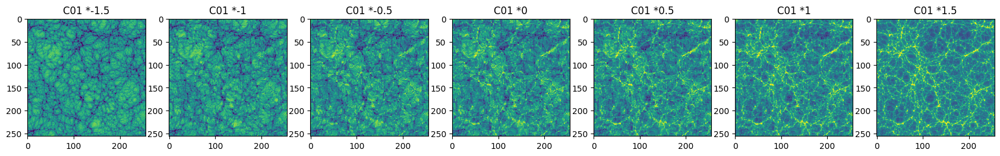

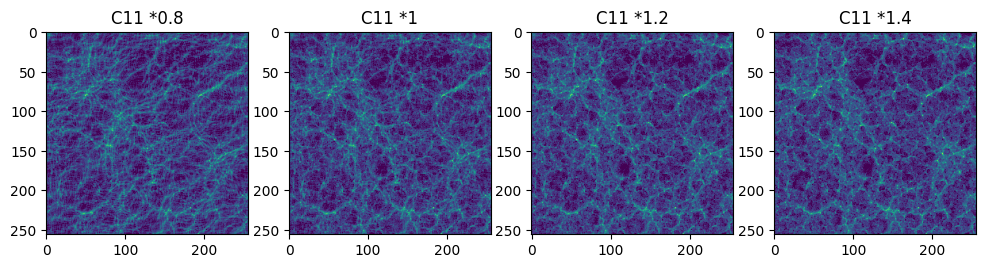

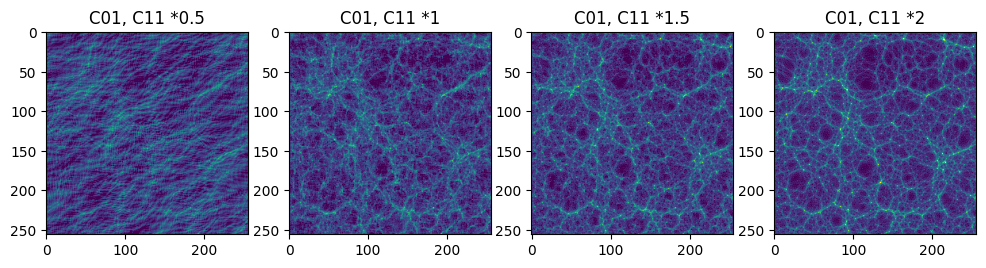

In [151]:
# plot result
param_list = param_list1
plt.figure(figsize=(len(param_list)*3,3),dpi=100)
for i in range(len(param_list)):
  plt.subplot(1,len(param_list),i+1)
  plt.imshow(image_syn[i], vmin=-3, vmax=3); plt.title('C01 *'+str(param_list[i]))
plt.show()

param_list = param_list2
plt.figure(figsize=(len(param_list2)*3,3),dpi=100)
for i in range(len(param_list)):
  plt.subplot(1,len(param_list),i+1)
  plt.imshow(image_syn[i+len(param_list1)], vmin=-1.5, vmax=6); 
  plt.title('C11 *'+str(param_list[i]))
plt.show()

param_list = param_list3
plt.figure(figsize=(len(param_list)*3,3),dpi=100)
for i in range(len(param_list)):
  plt.subplot(1,len(param_list),i+1)
  plt.imshow(image_syn[i+len(param_list1)+len(param_list2)], vmin=-1.5, vmax=6); 
  plt.title('C01, C11 *'+str(param_list[i]))
plt.show()

### changing orientation amplitude

In [2]:
# define calculators
M = N = 256; J = 7; L = 4
st_calc = scattering.Scattering2d(M, N, J, L, device='gpu', wavelets='morlet')

# load image
image_input = scattering.whiten(np.log(np.load(colab_dir + 'H81_0_Quijote.npy')[None,:M,:N]+1))
# image_input = scattering.whiten(np.load(colab_dir + 'H51_9.npy')[None,:M,:N])

# calculate estimators
s_cov_set = st_calc.scattering_cov(image_input, flatten=True)
index_type, j1, l1, j2, l2, j3, l3 = s_cov_set['index_for_synthesis_iso']

In [13]:
# a function to change the angular oscillation of C01 and/or C11 by a factor
def modify_angular(s_cov_set, factor, C01=False, C11=False, keep_para=False):
    s_cov = s_cov_set['for_synthesis_iso'].cpu()*1.
    N_img = len(s_cov)
    if keep_para:
        if C01:
            s_cov[:,index_type==3] += (s_cov[:,index_type==3].reshape(N_img,-1,L) - 
                s_cov[:,index_type==3].reshape(N_img,-1,L)[:,:,0:1]).reshape(N_img,-1) * factor
            s_cov[:,index_type==4] += (s_cov[:,index_type==4].reshape(N_img,-1,L) - 
                s_cov[:,index_type==4].reshape(N_img,-1,L)[:,:,0:1]).reshape(N_img,-1) * factor
        if C11:
            s_cov[:,index_type==5] += (s_cov[:,index_type==5].reshape(N_img,-1,L,L) - 
                s_cov[:,index_type==5].reshape(N_img,-1,L,L)[:,:,0:1,0:1]).reshape(N_img,-1) * factor
            s_cov[:,index_type==6] += (s_cov[:,index_type==6].reshape(N_img,-1,L,L) - 
                s_cov[:,index_type==6].reshape(N_img,-1,L,L)[:,:,0:1,0:1]).reshape(N_img,-1) * factor
    else:
        if C01:
            s_cov[:,index_type==3] += (s_cov[:,index_type==3].reshape(N_img,-1,L) - 
                s_cov[:,index_type==3].reshape(N_img,-1,L).mean(-1)[:,:,None]).reshape(N_img,-1) * factor
            s_cov[:,index_type==4] += (s_cov[:,index_type==4].reshape(N_img,-1,L) - 
                s_cov[:,index_type==4].reshape(N_img,-1,L).mean(-1)[:,:,None]).reshape(N_img,-1) * factor
        if C11:
            s_cov[:,index_type==5] += (s_cov[:,index_type==5].reshape(N_img,-1,L,L) - 
                s_cov[:,index_type==5].reshape(N_img,-1,L,L).mean((-2,-1))[:,:,None,None]).reshape(N_img,-1) * factor
            s_cov[:,index_type==6] += (s_cov[:,index_type==6].reshape(N_img,-1,L,L) - 
                s_cov[:,index_type==6].reshape(N_img,-1,L,L).mean((-2,-1))[:,:,None,None]).reshape(N_img,-1) * factor
    return s_cov

/content/drive/MyDrive/Colab Notebooks/scattering/__init__.py:43: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if image_init=='random phase':


# of estimators:  2927
max residual:  0.17195559 , mean residual:  0.0020406947
max residual:  0.072728634 , mean residual:  0.0008217762
time used:  92.66530680656433 s


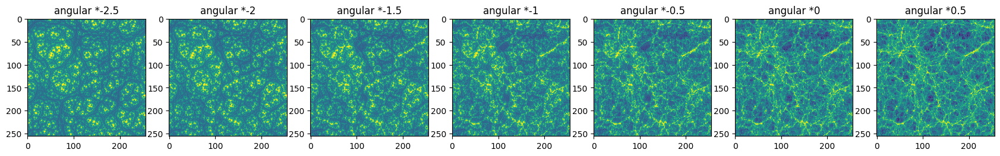

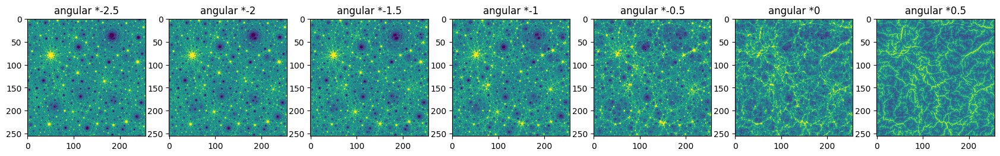

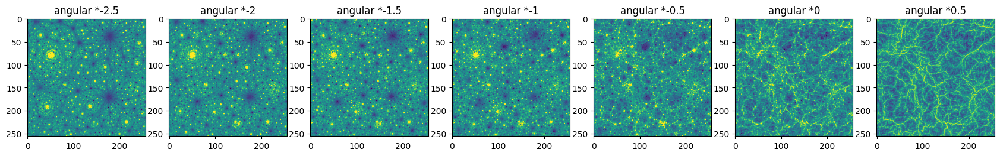

In [14]:
# change the orientation amplitude of C01 and C11 (keep the l1=l2=l3 coef)
s_cov_list = []
param_list1 = [-2.5, -2, -1.5, -1, -0.5, 0, 0.5]
for factor in param_list1:
    s_cov = modify_angular(s_cov_set, factor, C01=True, keep_para=True)
    s_cov_list.append(s_cov)

param_list2 = [-2.5, -2, -1.5, -1, -0.5, 0, 0.5]
for factor in param_list2:
    s_cov = modify_angular(s_cov_set, factor, C11=True, keep_para=True)
    s_cov_list.append(s_cov)

param_list3 = [-2.5, -2, -1.5, -1, -0.5, 0, 0.5]
for factor in param_list3:
    s_cov = modify_angular(s_cov_set, factor, C01=True, C11=True, keep_para=True)
    s_cov_list.append(s_cov)

# synthesize based on values of coefficients
image_syn = scattering.synthesis(
    's_cov_iso', target=torch.cat(s_cov_list, dim=0), 
    M=M, N=N, J=J, L=L, 
    mode='estimator', steps=300, 
    image_init = image_input * np.ones((len(param_list1)+len(param_list2)+len(param_list3),1,1))
)

# plot
start_index = [0, len(param_list1), len(param_list1)+len(param_list2)]
for list_index, param_list in enumerate([param_list1, param_list2, param_list3]):
    plt.figure(figsize=(len(param_list)*3,3),dpi=100)
    for i in range(len(param_list)):
        plt.subplot(1,len(param_list),i+1)
        plt.imshow(image_syn[i+start_index[list_index]], vmin=-3, vmax=3)
        plt.title('angular *'+str(param_list[i]))
    plt.show()

/content/drive/MyDrive/Colab Notebooks/scattering/__init__.py:43: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if image_init=='random phase':


# of estimators:  2927
max residual:  0.08968302 , mean residual:  0.0010009484
max residual:  0.025203984 , mean residual:  0.0004403764
time used:  89.83497476577759 s


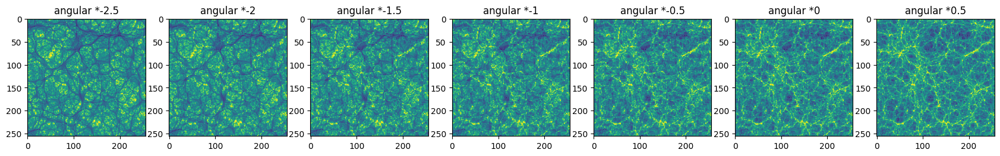

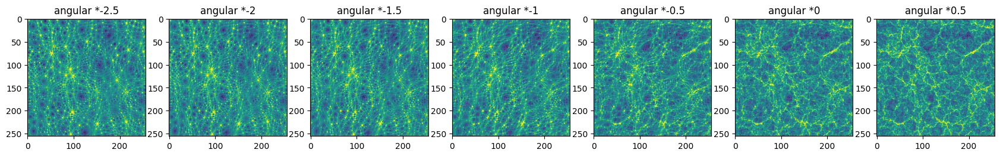

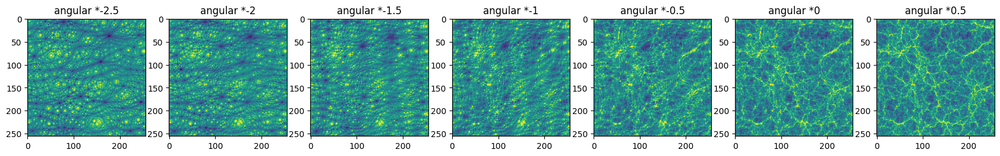

In [15]:
# change the orientation amplitude of C01 and C11 (keep the mean)
s_cov_list = []
param_list1 = [-2.5, -2, -1.5, -1, -0.5, 0, 0.5]
for factor in param_list1:
    s_cov = modify_angular(s_cov_set, factor, C01=True)
    s_cov_list.append(s_cov)

param_list2 = [-2.5, -2, -1.5, -1, -0.5, 0, 0.5]
for factor in param_list2:
    s_cov = modify_angular(s_cov_set, factor, C11=True)
    s_cov_list.append(s_cov)

param_list3 = [-2.5, -2, -1.5, -1, -0.5, 0, 0.5]
for factor in param_list3:
    s_cov = modify_angular(s_cov_set, factor, C01=True, C11=True)
    s_cov_list.append(s_cov)

# synthesize based on values of coefficients
image_syn = scattering.synthesis(
    's_cov_iso', target=torch.cat(s_cov_list, dim=0), 
    M=M, N=N, J=J, L=L, 
    mode='estimator', steps=300, 
    image_init = image_input * np.ones((len(param_list1)+len(param_list2)+len(param_list3),1,1))
)

# plot
start_index = [0, len(param_list1), len(param_list1)+len(param_list2)]
for list_index, param_list in enumerate([param_list1, param_list2, param_list3]):
    plt.figure(figsize=(len(param_list)*3,3),dpi=100)
    for i in range(len(param_list)):
        plt.subplot(1,len(param_list),i+1)
        plt.imshow(image_syn[i+start_index[list_index]], vmin=-3, vmax=3)
        plt.title('angular *'+str(param_list[i]))
    plt.show()

In [ ]:
# L = 4
# coef = s_cov['for_synthesis_iso']
# index_type, j1, l1, j2, l2, j3, l3 = s_cov['index_for_synthesis_iso']

# C01re_f = torch.fft.rfft(coef[:,index_type==3].reshape(-1,L))
# select1 = C01re_f.abs() > 1e-5
# C01im_f = torch.fft.rfft(coef[:,index_type==4].reshape(-1,L))
# select2 = C01im_f.abs() > 1e-5
# C11re_f = torch.fft.rfft2(coef[:,index_type==5].reshape(-1,L,L))
# select3 = C11re_f.abs() > 1e-5
# C11im_f = torch.fft.rfft2(coef[:,index_type==6].reshape(-1,L,L))
# select4 = C11im_f.abs() > 1e-5

# return torch.cat((
#     (coef[:,index_type<3]),
#     (C01re_f.select1.real,
#     (C01re_f.reshape(len(coef),-1)).imag,
#     (C01im_f.reshape(len(coef),-1)).real,
#     (C01im_f.reshape(len(coef),-1)).imag,
#     (C11re_f.reshape(len(coef),-1)).real,
#     (C11re_f.reshape(len(coef),-1)).imag,
#     (C11im_f.reshape(len(coef),-1)).real,
#     (C11im_f.reshape(len(coef),-1)).imag,
# ), dim=-1)

### example of another field

In [ ]:
# define calculators
M = N = 256; J = 7; L = 4
st_calc = scattering.Scattering2d(M, N, J, L, device='gpu', wavelets='morlet')

# load image
# image_input = scattering.whiten(np.log(np.load(colab_dir + 'H81_0_Quijote.npy')[None,:M,:N]+1))
image_input = scattering.whiten(np.load(colab_dir + 'H51_9.npy')[None,:M,:N])

# calculate estimators
s_cov_set = st_calc.scattering_cov(image_input, flatten=True)
index_type, j1, l1, j2, l2, j3, l3 = s_cov_set['index_for_synthesis_iso']

In [135]:
# change the overall amplitude of C01 coefficients
s_cov_list = []
param_list1 = [-1.5, -1, -0.5, 0, 0.5, 1, 1.5]
for factor in param_list1:
    s_cov = s_cov_set['for_synthesis_iso'].cpu()*1.
    s_cov[:,index_type==3] *= factor # C01_real is scaled by a factor
    s_cov[:,index_type==4] *= factor # C01_imag is scaled by a factor
    s_cov_list.append(s_cov)

# change the overal amplitude of C11 coefficients
param_list2 = [0.8, 1, 1.2, 1.4]
for factor in param_list2:
    s_cov = s_cov_set['for_synthesis_iso'].cpu()*1.
    s_cov[:,index_type==5] *= factor # C11_real is scaled by a factor
    s_cov[:,index_type==6] *= factor # C11_imag is scaled by a factor
    s_cov_list.append(s_cov)

# change the overal amplitude of both C01 and C11 coefficients
param_list3 = [0.5, 1, 1.5, 2]
for factor in param_list3:
    s_cov = s_cov_set['for_synthesis_iso'].cpu()*1.
    s_cov[:,(index_type>=3)*(index_type<=6)] *= factor # C10, C11 are scaled by a factor
    s_cov_list.append(s_cov)

coef_target = torch.cat(s_cov_list, dim=0)
image_init = image_input * np.ones(
    (len(param_list1) + len(param_list2) + len(param_list3),1,1))

# synthesize based on values of coefficients
image_syn = scattering.synthesis(
    's_cov_iso', coef_target, M=M, N=N, J=J, L=L, 
    mode='estimator', steps=300, image_init=image_init)

/content/drive/MyDrive/Colab Notebooks/scattering/__init__.py:40: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if image_init=='random phase':


# of estimators:  2927
max residual:  0.33624285 , mean residual:  0.0027040604
max residual:  0.08937001 , mean residual:  0.00061631395
time used:  49.95631742477417 s


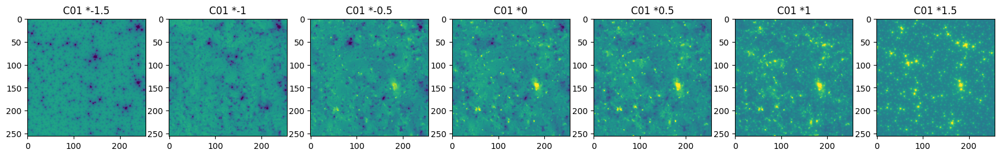

In [138]:
param_list = param_list1
plt.figure(figsize=(len(param_list)*3,3),dpi=100)
for i in range(len(param_list)):
  plt.subplot(1,len(param_list),i+1)
  plt.imshow(image_syn[i], vmin=-6, vmax=6); plt.title('C01 *'+str(param_list[i]))
plt.show()

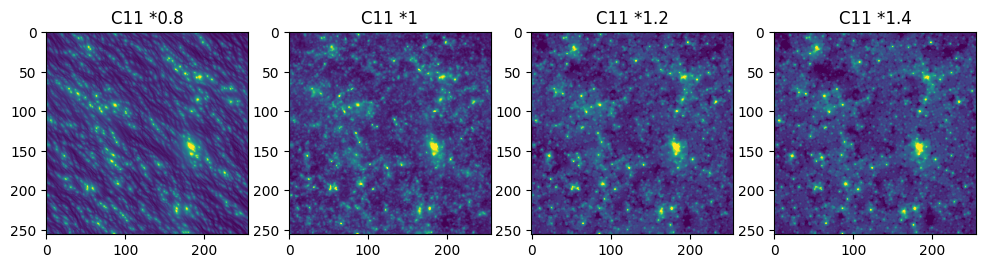

In [145]:
param_list = param_list2
plt.figure(figsize=(len(param_list2)*3,3),dpi=100)
for i in range(len(param_list)):
  plt.subplot(1,len(param_list),i+1)
  plt.imshow(image_syn[i+len(param_list1)], vmin=-1.5, vmax=6); 
  plt.title('C11 *'+str(param_list[i]))
plt.show()

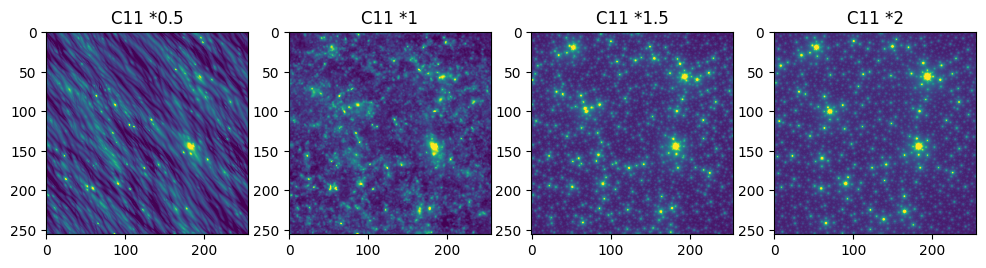

In [146]:
param_list = param_list3
plt.figure(figsize=(len(param_list)*3,3),dpi=100)
for i in range(len(param_list)):
  plt.subplot(1,len(param_list),i+1)
  plt.imshow(image_syn[i+len(param_list1)+len(param_list2)], vmin=-1.5, vmax=6); 
  plt.title('C11 *'+str(param_list[i]))
plt.show()

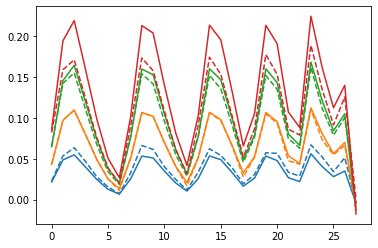

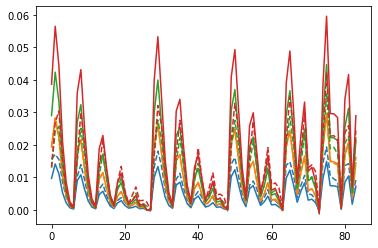

In [132]:
# check convergence (solid/dashed lines are target coef / coef of synthesized images)
s_cov_syn = st_calc.scattering_cov(image_syn, flatten=True)
coef_syn = s_cov_syn['for_synthesis_iso'].cpu()

for i in range(len(param_list)):
    plt.plot(coef_target[i,index_type==3].reshape(-1,4)[:,0], color='C'+str(i), ls='-')
    plt.plot(coef_syn[i,index_type==3].reshape(-1,4)[:,0], color='C'+str(i), ls='--')
plt.show()

for i in range(len(param_list)):
    plt.plot(coef_target[i,index_type==5].reshape(-1,4,4)[:,0,0], color='C'+str(i), ls='-')
    plt.plot(coef_syn[i,index_type==5].reshape(-1,4,4)[:,0,0], color='C'+str(i), ls='--')
plt.show()

### other synthesis result with manipulated estimators (not polished yet)

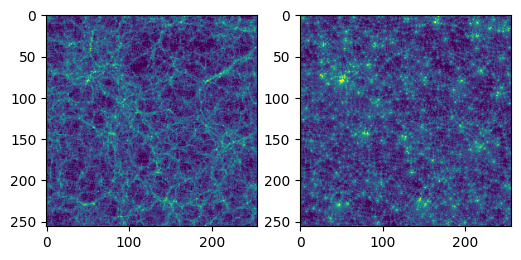

In [ ]:
plt.figure(figsize=(6,3),dpi=100)
plt.subplot(121)
plt.imshow((image_target1[0] - image_target1[0].mean())/ image_target1[0].std(), vmin=-1.5, vmax=5.15)#vmin=0, vmax=6
plt.subplot(122)
plt.imshow((image_syn[0] - image_syn[0].mean()) / image_syn[0].std(), vmin=-1.5, vmax=5.15)#vmin=0, vmax=6 
plt.show()

## 2.3 two fields, image target

In [2]:
# load image
import numpy as np
image_target = np.load(colab_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:,:,1,0]
image_b = np.load(colab_dir + 'turbulence/iso/iso_p_t1z1.npy')[None,:,:,1,0]

# downsampling (make the images smaller)
for level in range(2):
    image_target = scattering.downsample(image_target)
    image_b      = scattering.downsample(image_b)

# synthesize
# 's_mean', 's_mean_iso', 's_cov', 's_cov_iso', 'alpha_cov', 'bispectrum'
image_syn = scattering.synthesis(
    's_cov_2fields_iso', target=image_target, mode='image', image_b=image_b, image_init='random phase',
    steps=800, learning_rate=0.5, device='gpu', seed=0,
    # print_each_step=True
)

input_size:  (1, 256, 256)
# of estimators:  8086
max residual:  0.28264487 , mean residual:  0.002795604
max residual:  0.00022033788 , mean residual:  1.34883885e-05
time used:  198.69255828857422 s


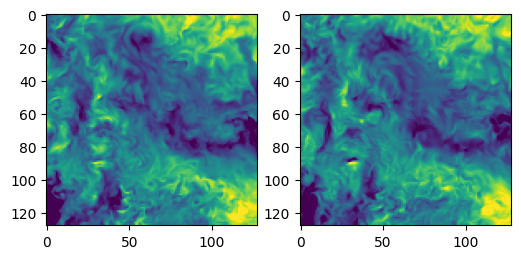

In [3]:
# s_cov_iso, step=800, 199s, t1z1, P00, from GRF, 0.5
plt.figure(figsize=(6,3),dpi=100)
plt.subplot(121)
plt.imshow(image_target[0][:128,:128], vmin=-1, vmax=1)
plt.subplot(122)
plt.imshow(image_syn[0][:128,:128], vmin=-1, vmax=1)
plt.show()

### synthesis results with other settings

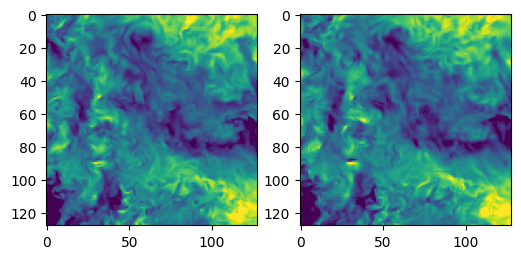

In [ ]:
# s_cov_iso, step=800, 255s, t1z1, old

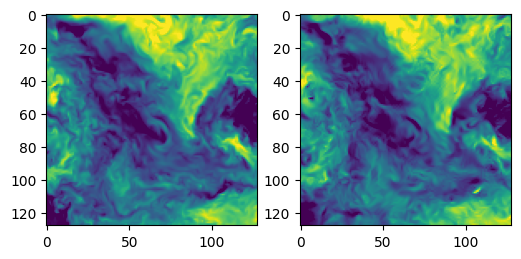

In [ ]:
# s_cov_iso, step=800, 308s, t501z1, P00, from GRF

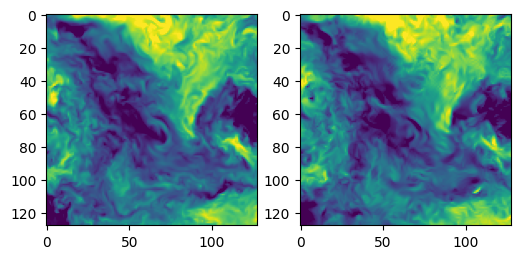

In [ ]:
# s_cov_iso, step=800, 317s, t501z1, P00, from GRF, 0.2

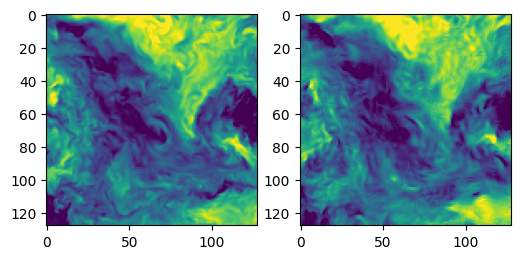

In [ ]:
# s_cov_iso, step=800, 306s, t501z1, P11, from GRF, 0.2

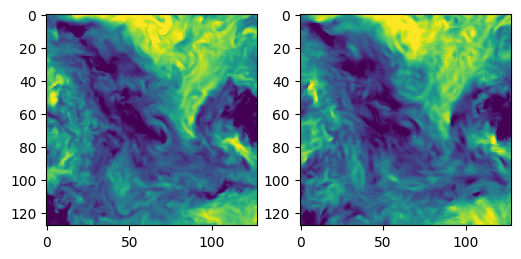

In [ ]:
# s_cov_iso, step=800, 300s, t501z1, P11, from GRF, 0.5

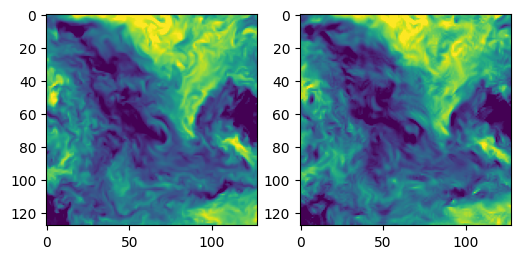

In [ ]:
# s_cov_iso, step=800, 255s, t501z1, P11, old
plt.figure(figsize=(6,3),dpi=100)
plt.subplot(121)
plt.imshow(image_target[0][:128,:128], vmin=-1, vmax=1)#vmin=0, vmax=6
plt.subplot(122)
plt.imshow(image_syn[0][:128,:128], vmin=-1, vmax=1)#vmin=0, vmax=6
plt.show()

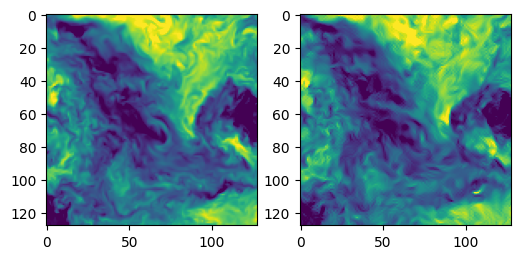

In [ ]:
# s_cov_iso, step=800, 308s, t501z1, P00, from WN, 0.5

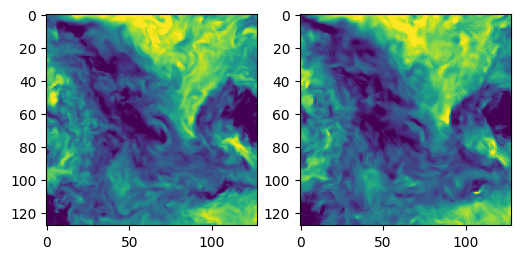

In [ ]:
# s_cov_iso, step=800, 299s, t501z1, P00, from WN, 0.2

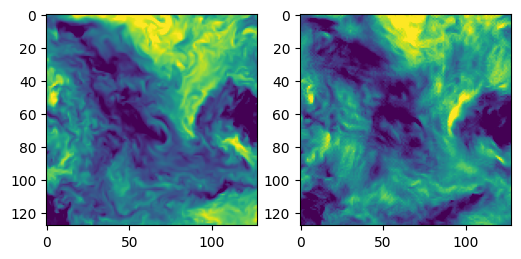

In [ ]:
# s_cov_iso, step=800, 300s, t501z1, P11, from WN, 0.2

### for comparison: single field synthesis

input_size:  (1, 256, 256)
# of estimators:  2927
max residual:  0.1281147 , mean residual:  0.0022877108
max residual:  0.0083618425 , mean residual:  0.00018715639
time used:  22.120378494262695 s


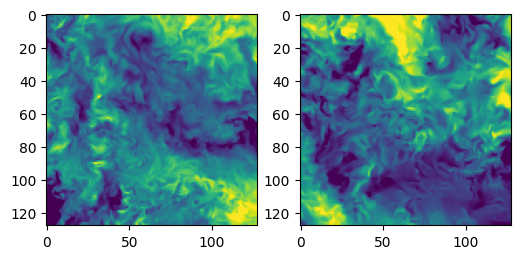

In [10]:
# load image
image_target = np.load(colab_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:,:,1,0]
image_b = np.load(colab_dir + 'turbulence/iso/iso_p_t1z1.npy')[None,:,:,1,0]

# downsampling (make the images smaller)
for level in range(2):
    image_target = scattering.downsample(image_target)
    image_b      = scattering.downsample(image_b)

# s_cov_iso single field
image_syn = scattering.synthesis(
    's_cov_iso', target=image_target, mode='image', image_init='random phase',
    steps=200, learning_rate=0.5,device='gpu', seed=0,
)

plt.figure(figsize=(6,3),dpi=100)
plt.subplot(121)
plt.imshow(image_target[0][:128,:128], vmin=-1, vmax=1)
plt.subplot(122)
plt.imshow(image_syn[0][:128,:128], vmin=-1, vmax=1)
plt.show()